# Phase 1

In this stage, the ISIC dataset metadata file was loaded and examined to understand the available attributes for each dermoscopic image. The dataset contains approximately 19,000 entries, each describing an image’s diagnosis, anatomical location, and patient-related information such as age and sex. To prepare the data for the classification task, only entries with valid diagnostic labels (diagnosis_3) were retained. The class distribution was then visualized to analyze data imbalance among different lesion types. Next, a preprocessing function was implemented to resize all images to 224×224 pixels, normalize pixel values to the [0,1] range, and convert them from BGR to RGB color space. Several random samples from the dataset were displayed to verify preprocessing results and ensure correct label-image correspondence. Finally, the dataset was split into training and testing subsets using stratified sampling, preserving class balance across partitions. This establishes a clean and standardized input pipeline for the subsequent deep learning model development.

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns

In [ ]:
# GLOBAL CONFIGS AND LOADING METADATA
IMG_SIZE = (224, 224)
DATA_DIR = "/content/drive/MyDrive/CSCI7335/Project/ISIC-images"
META_FILE = "/content/drive/MyDrive/CSCI7335/Project/bcn20000_metadata_2025-09-26.csv"

df = pd.read_csv(META_FILE)
print("Initial shape:", df.shape)

# Keeping only images with valid diagnosis_3 labels since it represents the name/type of the lesion
df = df.dropna(subset=["diagnosis_3"]).reset_index(drop=True)
print("Filtered shape:", df.shape)

Initial shape: (18946, 15)
Filtered shape: (17639, 15)


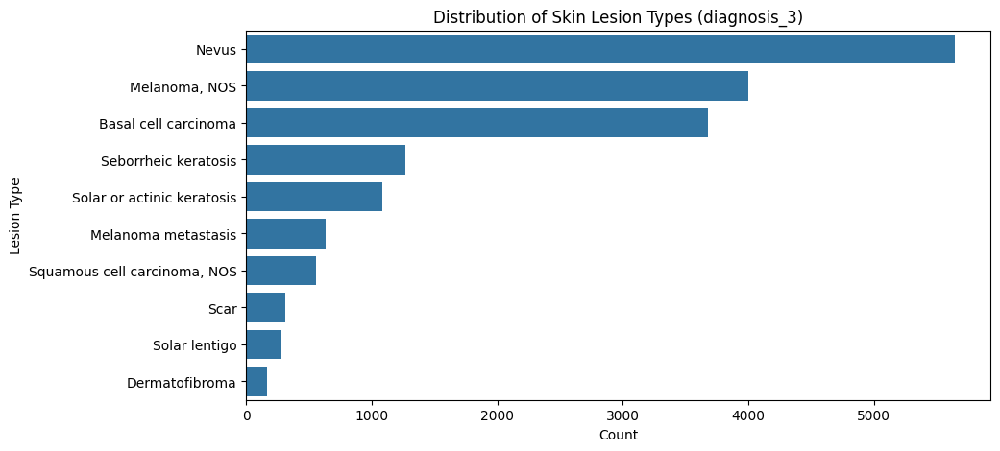

In [ ]:
# CHECKING LABEL DISTRIBUTION
plt.figure(figsize=(10, 5))
sns.countplot(y="diagnosis_3", data=df, order=df["diagnosis_3"].value_counts().index)
plt.title("Distribution of Skin Lesion Types (diagnosis_3)")
plt.xlabel("Count")
plt.ylabel("Lesion Type")
plt.show()

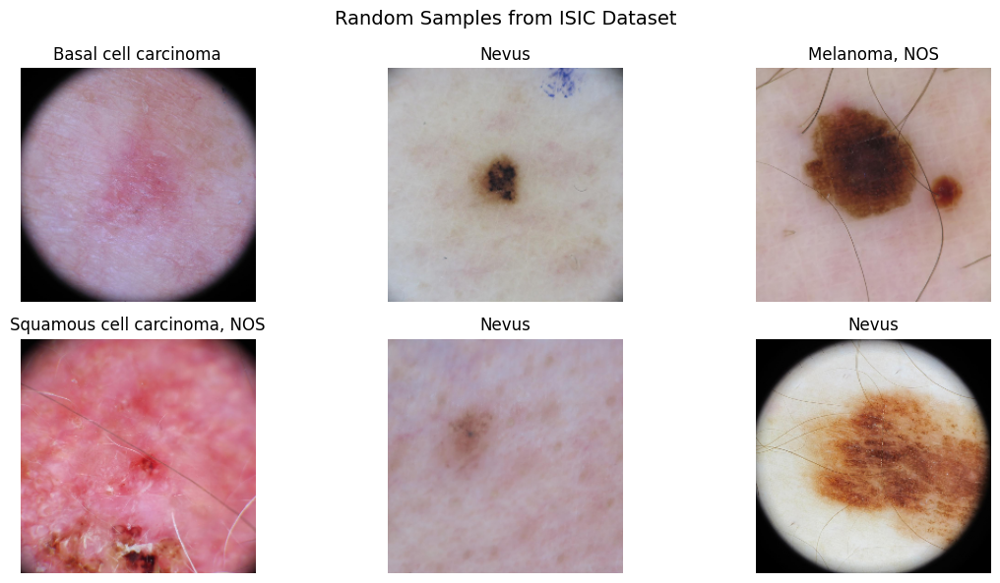

In [ ]:
# PREPROCESSING FUNCTION FOR THE IMAGES
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    img = img / 255.0
    return img

# VISUALIZING RANDOM SAMPLES
def show_samples(df, num_samples=6):
    plt.figure(figsize=(12, 6))
    samples = df.sample(num_samples)
    for i, row in enumerate(samples.itertuples(), 1):
        img_path = os.path.join(DATA_DIR, row.isic_id + ".jpg")
        img = preprocess_image(img_path)
        if img is not None:
            plt.subplot(2, 3, i)
            plt.imshow(img)
            plt.title(row.diagnosis_3)
            plt.axis("off")
    plt.suptitle("Random Samples from ISIC Dataset", fontsize=14)
    plt.tight_layout()
    plt.show()

show_samples(df)

In [ ]:
# TRAIN-TEST DATASETS SPLIT
train_df, test_df = train_test_split(
    df, test_size=0.2, stratify=df["diagnosis_3"], random_state=42
)
print(f"Train size: {len(train_df)}, Test size: {len(test_df)}")

Train size: 14111, Test size: 3528


# Phase 2

In this phase, the project transitioned from data preprocessing to model development using transfer learning. The ISIC dataset metadata was parsed to link each image file with its diagnostic label, and all samples with missing or invalid labels were removed. The dataset was then divided into training, validation, and testing subsets using stratified sampling to preserve class proportions. To mitigate data imbalance, class weights were computed dynamically based on sample frequencies. A data pipeline was built using TensorFlow’s tf.data API, which performs decoding, resizing, normalization, and on-the-fly augmentation to improve generalization. A pre-trained EfficientNetB0 architecture was employed as the backbone, with its final layers fine-tuned for multi-class skin lesion classification. The model was trained in two stages—first with the base network frozen, then with partial fine-tuning using a lower learning rate. Throughout training, callbacks such as early stopping, learning-rate reduction, and model checkpointing were applied to optimize convergence. Finally, performance metrics including accuracy, confusion matrix, and classification report were generated, and both the trained model and outputs were saved for later explainability analysis using Grad-CAM.

In [ ]:
import os, math, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

DATA_DIR = "/content/drive/MyDrive/CSCI7335/Project/ISIC-images"
META_FILE = "/content/drive/MyDrive/CSCI7335/Project/bcn20000_metadata_2025-09-26.csv"
OUTPUT_DIR = "/content/drive/MyDrive/CSCI7335/Project/"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Hyperparameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 15
BASE_LR = 1e-3
VAL_SPLIT = 0.15              # from the train portion
TEST_SIZE = 0.15              # final test split
AUGMENT = True                # on/off

df = pd.read_csv(META_FILE)
print("Initial shape:", df.shape)

Initial shape: (18946, 15)


In [ ]:
df = df.dropna(subset=["diagnosis_3"]).reset_index(drop=True)

# keeping only dermoscopic images if multiple types exist
if "image_type" in df.columns:
    before = len(df)
    df = df[df["image_type"] == "dermoscopic"].reset_index(drop=True)
    print(f"Kept dermoscopic only: {before} -> {len(df)}")

# building absolute file path from isic_id
def make_path(isic_id):
    p = os.path.join(DATA_DIR, f"{isic_id}.jpg")
    return p

df["filepath"] = df["isic_id"].apply(make_path)
exists = df["filepath"].apply(os.path.exists)
missing = (~exists).sum()
if missing > 0:
    print(f"{missing} files listed in metadata not found on disk. Dropping them.")
df = df[exists].reset_index(drop=True)

# encoding labels
labels = df["diagnosis_3"].astype(str)
classes = sorted(labels.unique().tolist())
class2idx = {c:i for i,c in enumerate(classes)}
idx2class = {i:c for c,i in class2idx.items()}
df["label_idx"] = labels.map(class2idx)

print("Num classes:", len(classes))
print("Classes:", classes[:10], "...")

Kept dermoscopic only: 17639 -> 17639
Num classes: 10
Classes: ['Basal cell carcinoma', 'Dermatofibroma', 'Melanoma metastasis', 'Melanoma, NOS', 'Nevus', 'Scar', 'Seborrheic keratosis', 'Solar lentigo', 'Solar or actinic keratosis', 'Squamous cell carcinoma, NOS'] ...


In [ ]:
# Train/Val/Test split (stratified)
train_df, test_df = train_test_split(
    df, test_size=TEST_SIZE, stratify=df["label_idx"], random_state=SEED
)
train_df, val_df = train_test_split(
    train_df, test_size=VAL_SPLIT, stratify=train_df["label_idx"], random_state=SEED
)

print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")

Train: 12744 | Val: 2249 | Test: 2646


In [ ]:

# tf.data pipeline
AUTOTUNE = tf.data.AUTOTUNE

from tensorflow.keras.applications.efficientnet import preprocess_input

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = preprocess_input(img)
    return img, tf.cast(label, tf.int32)

def augment(img, label):
    if AUGMENT:
        img = tf.image.random_flip_left_right(img)
        img = tf.image.random_flip_up_down(img)
        img = tf.image.random_brightness(img, max_delta=0.1)
        img = tf.image.random_contrast(img, 0.9, 1.1)
        angles = tf.random.uniform([], -0.1, 0.1)
        img = tfa.image.rotate(img, angles) if 'tfa' in globals() else img
    return img, label

try:
    import tensorflow_addons as tfa
    globals()['tfa'] = tfa
except:
    pass

def make_ds(paths, labels, shuffle=False, augment_on=False):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(2048, seed=SEED, reshuffle_each_iteration=True)
    if augment_on:
        ds = ds.map(augment, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return ds

train_ds = make_ds(train_df["filepath"].values, train_df["label_idx"].values,
                   shuffle=True, augment_on=True)
val_ds   = make_ds(val_df["filepath"].values,   val_df["label_idx"].values)
test_ds  = make_ds(test_df["filepath"].values,  test_df["label_idx"].values)

In [ ]:
# Model: EfficientNetB0 backbone + custom head
def build_model(num_classes):
    # Keras EfficientNetB0 expects [0,255] with internal rescaling; I already scaled to [0,1]
    # So I add a Rescaling(255) if I want to match pretrained stats, but it's fine to keep [0,1].
    inputs = layers.Input(shape=(*IMG_SIZE, 3))
    x = inputs

    base = keras.applications.EfficientNetB0(
        include_top=False, weights="imagenet", input_tensor=x
    )
    base.trainable = False  # freeze for initial training

    x = layers.GlobalAveragePooling2D()(base.output)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs)
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=BASE_LR),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model

num_classes = len(classes)
model = build_model(num_classes)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 224, 224,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,062,381 (15.50 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
# computing class weights (to mitigate imbalance)
train_counts = Counter(train_df["label_idx"].tolist())
total = sum(train_counts.values())
class_weight = {cls: total/(len(classes)*cnt) for cls, cnt in train_counts.items()}
print("Class weights (sample):", dict(list(class_weight.items())[:5]))

Class weights (sample): {8: 1.6213740458015267, 3: 0.44066390041493775, 6: 1.3912663755458514, 7: 6.247058823529412, 4: 0.3123529411764706}


In [ ]:
from tensorflow.keras import layers
from tensorflow import keras

#callbacks
ckpt_path = os.path.join(OUTPUT_DIR, "effb0_phase2_best.keras")
callbacks = [
    keras.callbacks.ModelCheckpoint(ckpt_path, monitor="val_accuracy",
                                    save_best_only=True, mode="max", verbose=1),
    keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=5,
                                  restore_best_weights=True, mode="max"),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5,
                                      patience=2, verbose=1, min_lr=1e-6),
]

#train (frozen base)
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    class_weight=class_weight,
    callbacks=callbacks,
    verbose=1
)

#fine-tuning
efficientnet_layers = [l for l in model.layers if "block" in l.name or "top_conv" in l.name]

print("Found EfficientNet layers:", len(efficientnet_layers))

N = 80
layers_to_unfreeze = efficientnet_layers[-N:]

for l in layers_to_unfreeze:
    if isinstance(l, layers.BatchNormalization):
        l.trainable = False   # BN katmanlarını kapalı tutmak önemli
    else:
        l.trainable = True

print(f"Unfroze last {len(layers_to_unfreeze)} EfficientNet layers.")

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)


ft_history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=max(5, EPOCHS//2),
    class_weight=class_weight,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/15
399/399 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.2798 - loss: 2.1688
Epoch 1: val_accuracy improved from -inf to 0.41618, saving model to /content/drive/MyDrive/CSCI7335/Project/effb0_phase2_best.keras
399/399 ━━━━━━━━━━━━━━━━━━━━ 61s 100ms/step - accuracy: 0.2800 - loss: 2.1684 - val_accuracy: 0.4162 - val_loss: 1.6852 - learning_rate: 0.0010
Epoch 2/15
395/399 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4044 - loss: 1.7836
Epoch 2: val_accuracy improved from 0.41618 to 0.44509, saving model to /content/drive/MyDrive/CSCI7335/Project/effb0_phase2_best.keras
399/399 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - accuracy: 0.4045 - loss: 1.7832 - val_accuracy: 0.4451 - val_loss: 1.5835 - learning_rate: 0.0010
Epoch 3/15
398/399 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4280 - loss: 1.6637
Epoch 3: val_accuracy improved from 0.44509 to 0.45353, saving model to /content/drive/MyDrive/CSCI7335/Project/effb0_phase2_best.keras
399/399 ━━━━━━━━━━━━━━━━━━━━ 23s 51ms/step - ac

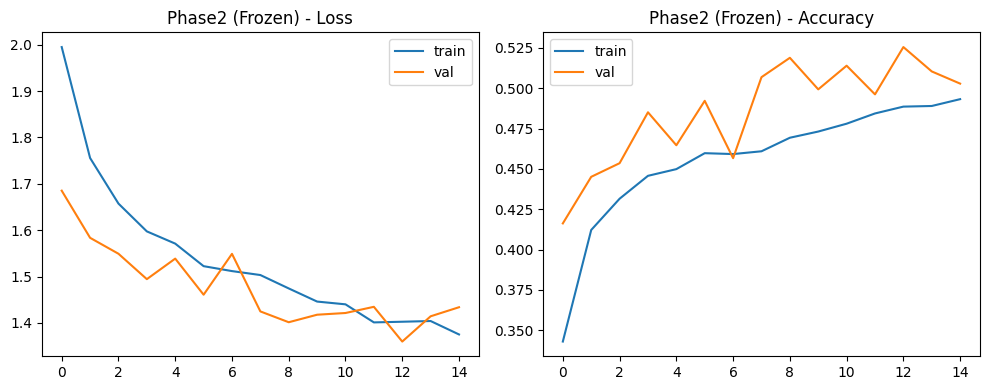

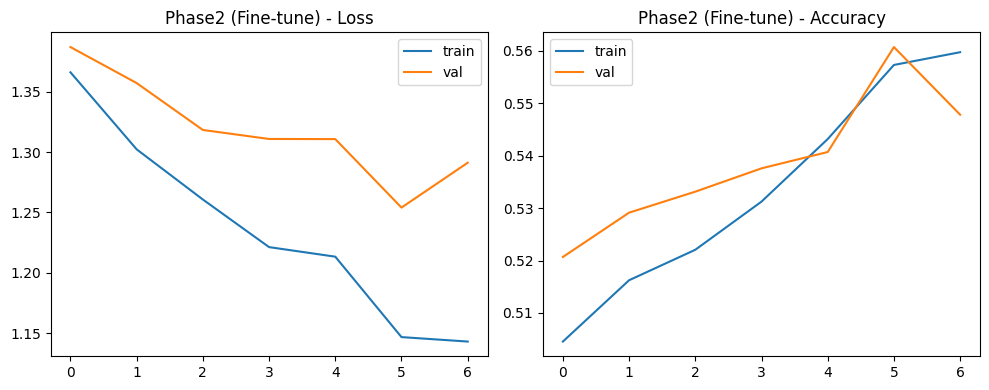

In [ ]:
# VISUALIZATION

#Plot training curves
def plot_curves(hist, title, out_png):
    plt.figure(figsize=(10,4))
    # loss
    plt.subplot(1,2,1)
    plt.plot(hist.history["loss"], label="train")
    plt.plot(hist.history["val_loss"], label="val")
    plt.title(f"{title} - Loss")
    plt.legend()
    # acc
    plt.subplot(1,2,2)
    plt.plot(hist.history["accuracy"], label="train")
    plt.plot(hist.history["val_accuracy"], label="val")
    plt.title(f"{title} - Accuracy")
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_png, dpi=160)
    plt.show()

plot_curves(history, "Phase2 (Frozen)", os.path.join(OUTPUT_DIR, "curves_frozen.png"))
plot_curves(ft_history, "Phase2 (Fine-tune)", os.path.join(OUTPUT_DIR, "curves_finetune.png"))

In [ ]:
#evaluation on test set
test_preds = model.predict(test_ds, verbose=1)
y_pred = np.argmax(test_preds, axis=1)
y_true = test_df["label_idx"].values

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=[idx2class[i] for i in range(num_classes)]))

83/83 ━━━━━━━━━━━━━━━━━━━━ 199s 2s/step

Classification Report:
                              precision    recall  f1-score   support

        Basal cell carcinoma       0.65      0.46      0.54       551
              Dermatofibroma       0.27      0.72      0.40        25
         Melanoma metastasis       0.27      0.65      0.38        95
               Melanoma, NOS       0.70      0.51      0.59       601
                       Nevus       0.79      0.66      0.72       847
                        Scar       0.13      0.51      0.20        47
        Seborrheic keratosis       0.34      0.38      0.36       190
               Solar lentigo       0.24      0.65      0.35        43
  Solar or actinic keratosis       0.41      0.44      0.42       163
Squamous cell carcinoma, NOS       0.29      0.42      0.34        84

                    accuracy                           0.54      2646
                   macro avg       0.41      0.54      0.43      2646
                weighted

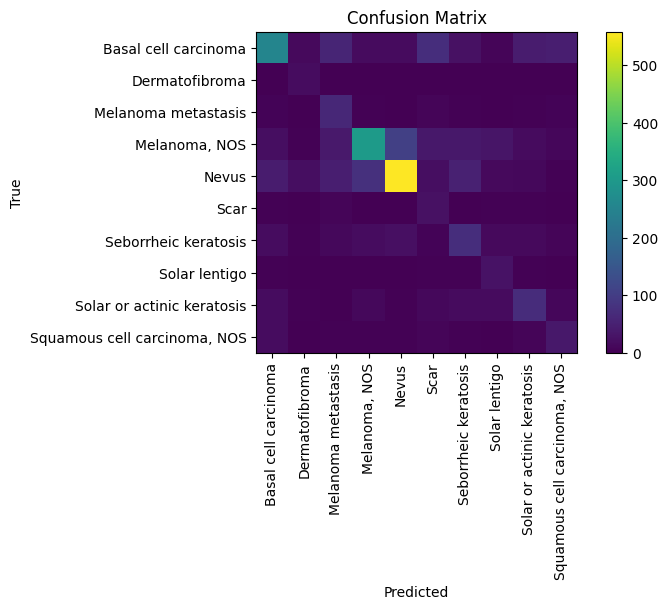

In [ ]:
#confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
plt.imshow(cm, interpolation='nearest')
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(num_classes)
plt.xticks(tick_marks, [idx2class[i] for i in range(num_classes)], rotation=90)
plt.yticks(tick_marks, [idx2class[i] for i in range(num_classes)])
plt.tight_layout()
plt.ylabel('True')
plt.xlabel('Predicted')
plt.savefig(os.path.join(OUTPUT_DIR, "confusion_matrix.png"), dpi=160, bbox_inches='tight')
plt.show()

In [ ]:
pd.Series(class2idx).to_csv(os.path.join(OUTPUT_DIR, "class2idx.csv"))
final_path = os.path.join(OUTPUT_DIR, "effb0_phase2_final.keras")
model.save(final_path)
print(f"\nSaved best checkpoint to: {ckpt_path}")
print(f"Saved final model to: {final_path}")
print(f"Outputs saved under: {OUTPUT_DIR}")


Saved best checkpoint to: /content/drive/MyDrive/CSCI7335/Project/effb0_phase2_best.keras
Saved final model to: /content/drive/MyDrive/CSCI7335/Project/effb0_phase2_final.keras
Outputs saved under: /content/drive/MyDrive/CSCI7335/Project/


# Phase 3

In Phase 3, a comprehensive evaluation framework was completed. The trained model was tested on the held-out test set, and performance metrics including precision, recall, F1-score, and overall accuracy were computed. A confusion matrix was generated to visualize misclassification patterns across lesion types. Additionally, ROC-AUC scores for multi-class classification were calculated using a one-vs-rest framework. All evaluation results were saved to disk for documentation and future analysis. The model was also saved in its updated final form, supporting further stages of explainability analysis.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import tensorflow as tf
from tensorflow import keras

#evaluating model on test set
print("\nEvaluating model on test set...")
test_preds = model.predict(test_ds, verbose=1)
y_pred = np.argmax(test_preds, axis=1)
y_true = test_df["label_idx"].values

#computing per class and overall metrics
report = classification_report(
    y_true, y_pred,
    target_names=[idx2class[i] for i in range(len(idx2class))],
    output_dict=True
)
report_df = pd.DataFrame(report).transpose()

print("\nClassification Report:")
print(report_df)

report_path = os.path.join(OUTPUT_DIR, "classification_report.csv")
report_df.to_csv(report_path, index=True)
print(f"Classification report saved to {report_path}")


Evaluating model on test set...
83/83 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

Classification Report:
                              precision    recall  f1-score      support
Basal cell carcinoma           0.652062  0.459165  0.538871   551.000000
Dermatofibroma                 0.272727  0.720000  0.395604    25.000000
Melanoma metastasis            0.268398  0.652632  0.380368    95.000000
Melanoma, NOS                  0.695652  0.505824  0.585742   601.000000
Nevus                          0.785915  0.658796  0.716763   847.000000
Scar                           0.126984  0.510638  0.203390    47.000000
Seborrheic keratosis           0.339623  0.378947  0.358209   190.000000
Solar lentigo                  0.237288  0.651163  0.347826    43.000000
Solar or actinic keratosis     0.405714  0.435583  0.420118   163.000000
Squamous cell carcinoma, NOS   0.291667  0.416667  0.343137    84.000000
accuracy                       0.538549  0.538549  0.538549     0.538549
macro avg                  

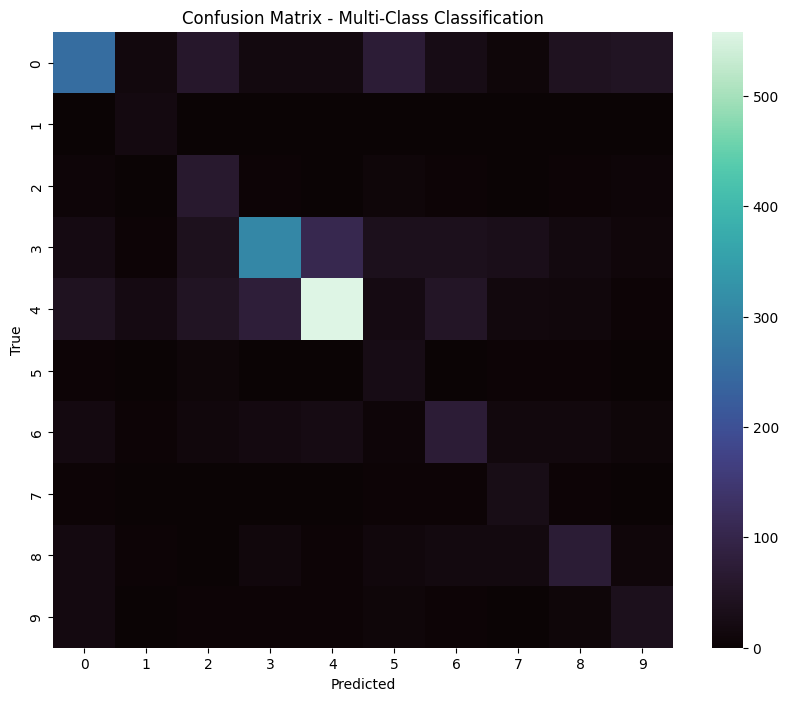

In [ ]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=False, fmt='d', cmap='mako')
plt.title("Confusion Matrix - Multi-Class Classification")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig(os.path.join(OUTPUT_DIR, "confusion_matrix_phase3.png"), dpi=200)
plt.show()


Macro-average ROC-AUC: 0.8892


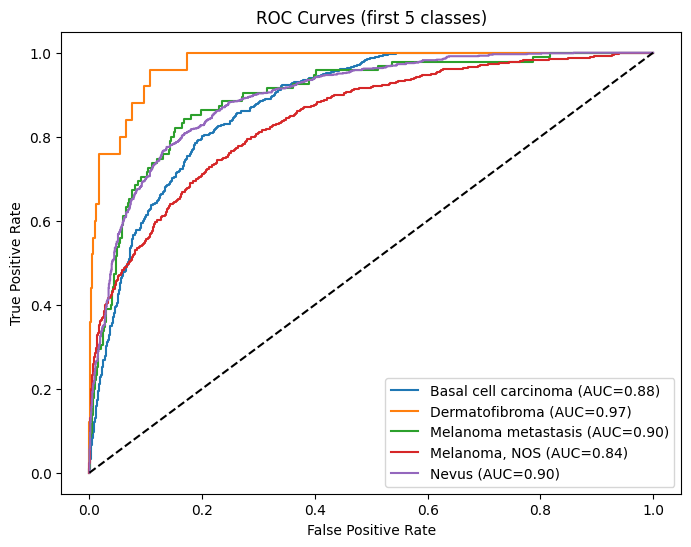

In [ ]:
#computing ROC curve and AUC for each class
y_true_bin = label_binarize(y_true, classes=list(range(len(idx2class))))
roc_auc = roc_auc_score(y_true_bin, test_preds, average="macro", multi_class="ovr")
print(f"\nMacro-average ROC-AUC: {roc_auc:.4f}")

#ploting ROC curves
plt.figure(figsize=(8, 6))
for i, cls in enumerate(list(idx2class.keys())[:5]):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], test_preds[:, i])
    plt.plot(fpr, tpr, label=f"{idx2class[cls]} (AUC={roc_auc_score(y_true_bin[:, i], test_preds[:, i]):.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (first 5 classes)")
plt.legend(loc="lower right")
plt.savefig(os.path.join(OUTPUT_DIR, "roc_curves_phase3.png"), dpi=200)
plt.show()

In [ ]:
# If still severe imbalance, retrain with focal loss or adjusted weights
"""
try:
    import tensorflow_addons as tfa
    focal_loss = tfa.losses.SigmoidFocalCrossEntropy()
    print("TensorFlow Addons Focal Loss available.")
except:
    focal_loss = "sparse_categorical_crossentropy"
    print("TensorFlow Addons not installed; using standard loss.")

retrain_with_focal = False
if retrain_with_focal:
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-5),
        loss=focal_loss,
        metrics=["accuracy"]
    )
    model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=5,
        class_weight=class_weight,
        callbacks=callbacks,
        verbose=1
    )
"""
final_model_path = os.path.join(OUTPUT_DIR, "effb0_phase3_final.keras")
model.save(final_model_path)
print(f"Phase 3 model saved to {final_model_path}")

Phase 3 model saved to /content/drive/MyDrive/CSCI7335/Project/effb0_phase3_final.keras


# Phase 4 (Grand-CAM)

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

# last convolutional layer name (EfficientNetB0)
LAST_CONV = "top_conv"

def get_gradcam_heatmap(model, img_array, class_index, layer_name=LAST_CONV):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)

    #global average pooling
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]  # (H, W, C)
    pooled_grads = pooled_grads     # (C,)

    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    #normalization between 0–1
    heatmap = np.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-10)

    return heatmap.numpy()

In [ ]:
import cv2

def overlay_heatmap(heatmap, img, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlayed = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)
    return overlayed

In [ ]:
from tensorflow.keras.preprocessing import image

def generate_gradcam_for_path(img_path, model):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img_resized = tf.image.resize(img, IMG_SIZE) / 255.0

    img_array = tf.expand_dims(img_resized, axis=0)

    preds = model.predict(img_array)
    class_index = np.argmax(preds[0])
    class_name = idx2class[class_index]

    heatmap = get_gradcam_heatmap(model, img_array, class_index)
    overlay = overlay_heatmap(heatmap, img.numpy())

    plt.figure(figsize=(10,5))
    plt.suptitle(f"Predicted: {class_name} ({preds[0][class_index]:.2f})", fontsize=14)

    plt.subplot(1,2,1)
    plt.imshow(img.numpy().astype("uint8"))
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Heatmap")
    plt.axis("off")

    plt.show()

In [ ]:
def gradcam_compare(img_path, true_label, model):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img_resized = tf.image.resize(img, IMG_SIZE) / 255.0

    img_array = tf.expand_dims(img_resized, axis=0)

    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])

    heatmap = get_gradcam_heatmap(model, img_array, pred_idx)
    overlay = overlay_heatmap(heatmap, img.numpy())

    plt.figure(figsize=(12,5))
    plt.suptitle(
        f"True: {idx2class[true_label]}\nPredicted: {idx2class[pred_idx]} ({preds[0][pred_idx]:.2f})",
        fontsize=14
    )

    plt.subplot(1,2,1)
    plt.imshow(img.numpy().astype("uint8"))
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title("Grad-CAM")
    plt.axis("off")

    plt.show()

In [ ]:
sample_paths = random.sample(df["filepath"].values.tolist(), 3)
sample_paths

['/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0070081.jpg',
 '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0066863.jpg',
 '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0059439.jpg']

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2

IMAGE_PATHS = [
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0070081.jpg',
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0066863.jpg',
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0059439.jpg'
]

IMG_SIZE = (224, 224)

class2idx = {
    'Basal cell carcinoma': 0,
    'Dermatofibroma': 1,
    'Melanoma metastasis': 2,
    'Melanoma, NOS': 3,
    'Nevus': 4,
    'Scar': 5,
    'Seborrheic keratosis': 6,
    'Solar lentigo': 7,
    'Solar or actinic keratosis': 8,
    'Squamous cell carcinoma, NOS': 9
}
idx2class = {v: k for k, v in class2idx.items()}

In [ ]:
def load_and_preprocess(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)

    orig = tf.image.resize(img, (350, 350))/255.0

    img = tf.image.resize(img, IMG_SIZE)
    img = img / 255.0
    img = tf.expand_dims(img, axis=0)
    return img, orig


def make_gradcam_heatmap(img_array, model, last_conv_layer_name="block6d_project_conv"):
    last_conv_layer = model.get_layer(last_conv_layer_name)

    grad_model = tf.keras.models.Model(
        [model.inputs],
        [last_conv_layer.output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        pred_index = tf.argmax(predictions[0])
        pred_score = predictions[:, pred_index]

    grads = tape.gradient(pred_score, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]

    heatmap = np.zeros(conv_outputs.shape[:2], dtype=np.float32)

    for i in range(pooled_grads.shape[-1]):
        heatmap += pooled_grads[i] * conv_outputs[:, :, i]

    heatmap = np.maximum(heatmap, 0)
    heatmap /= tf.reduce_max(heatmap) + 1e-10

    return heatmap.numpy(), int(pred_index)

def show_gradcam(img_path, model):
    img_pre, orig = load_and_preprocess(img_path)
    heatmap, pred_idx = make_gradcam_heatmap(img_pre, model)

    pred_class = idx2class[pred_idx]

    heatmap_resized = cv2.resize(heatmap, (orig.shape[1], orig.shape[0]))
    heatmap_color = cv2.applyColorMap(np.uint8(255*heatmap_resized), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = (heatmap_color * 0.4 + orig.numpy() * 255).astype(np.uint8)

    plt.figure(figsize=(12, 5))
    plt.suptitle(f"Prediction: {pred_class}", fontsize=15, fontweight='bold')

    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(orig)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Grad-CAM Heatmap")
    plt.imshow(heatmap, cmap="jet")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()

Processing: /content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0070081.jpg


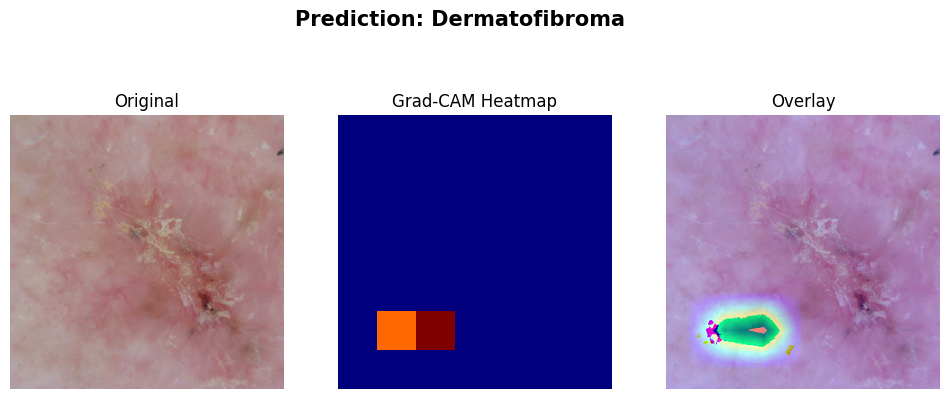

----------------------------------------
Processing: /content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0066863.jpg


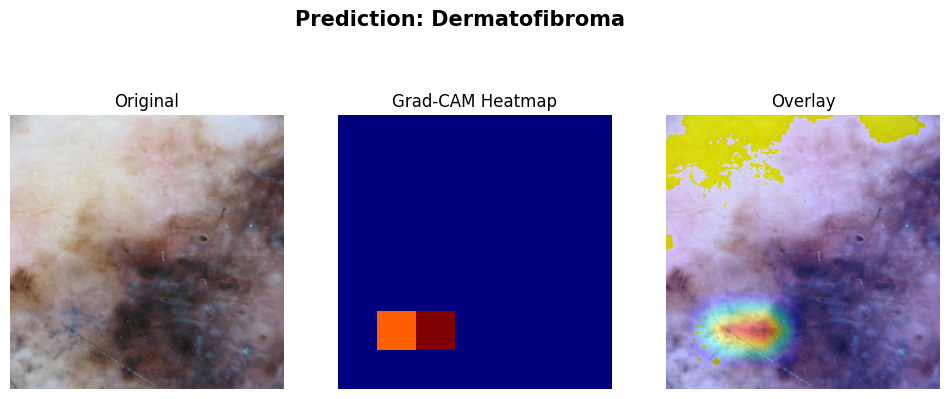

----------------------------------------
Processing: /content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0059439.jpg


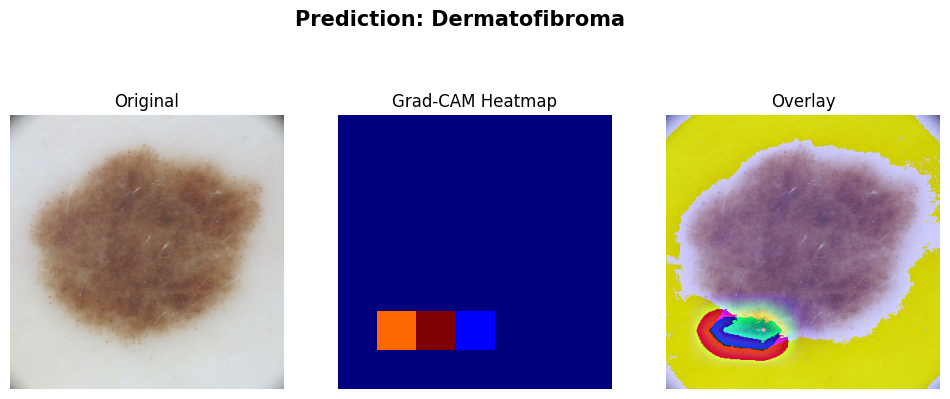

----------------------------------------


In [ ]:
for p in IMAGE_PATHS:
    print("Processing:", p)
    show_gradcam(p, model)
    print("----------------------------------------")

# Phase 4 (Grand-CAM++)

In [ ]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

def grad_cam_plus_plus(model, img_tensor, last_conv_layer_name):
    conv_layer = model.get_layer(last_conv_layer_name)

    grad_model = tf.keras.models.Model(
        [model.inputs],
        [conv_layer.output, model.output]
    )

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_out, preds = grad_model(img_tensor)
                pred_index = tf.argmax(preds[0])
                pred_score = preds[:, pred_index]

            # 1st gradient
            first_grad = tape3.gradient(pred_score, conv_out)

        # 2nd gradient
        second_grad = tape2.gradient(first_grad, conv_out)

    # 3rd gradient
    third_grad = tape1.gradient(second_grad, conv_out)

    conv_out = conv_out[0]     # (H, W, C)
    first_grad = first_grad[0]
    second_grad = second_grad[0]
    third_grad = third_grad[0]

    # Grad-CAM++ weights
    alpha_num = second_grad
    alpha_denom = second_grad * 2.0 + third_grad * conv_out
    alpha_denom = tf.where(alpha_denom != 0.0, alpha_denom, tf.ones_like(alpha_denom))
    alphas = alpha_num / alpha_denom

    positive_grads = tf.nn.relu(first_grad)
    weights = tf.reduce_sum(alphas * positive_grads, axis=(0, 1))

    # Weighted combination
    cam = tf.reduce_sum(weights * conv_out, axis=-1)

    # Normalize heatmap
    cam = tf.nn.relu(cam)
    cam = cam - tf.reduce_min(cam)
    cam = cam / (tf.reduce_max(cam) + 1e-10)

    return cam.numpy(), int(pred_index)

In [ ]:
def load_and_preprocess(img_path, img_size=(224, 224)):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)

    orig = tf.image.resize(img, (350, 350)) / 255.0

    img = tf.image.resize(img, img_size)
    img = img / 255.0
    img = tf.expand_dims(img, 0)
    return img, orig


def show_gradcam_plus(img_path, model, last_conv="block6d_project_conv", class_map=None):
    img_tensor, orig = load_and_preprocess(img_path)
    heatmap, pred_idx = grad_cam_plus_plus(model, img_tensor, last_conv)

    pred_class = class_map[pred_idx] if class_map else str(pred_idx)

    # Resize heatmap
    heatmap = cv2.resize(heatmap, (orig.shape[1], orig.shape[0]))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = (heatmap_color * 0.4 + orig.numpy() * 255).astype(np.uint8)

    plt.figure(figsize=(13, 5))
    plt.suptitle(f"Grad-CAM++ Prediction: {pred_class}", fontsize=16, fontweight='bold')

    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(orig)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Heatmap (Grad-CAM++)")
    plt.imshow(heatmap, cmap="jet")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()

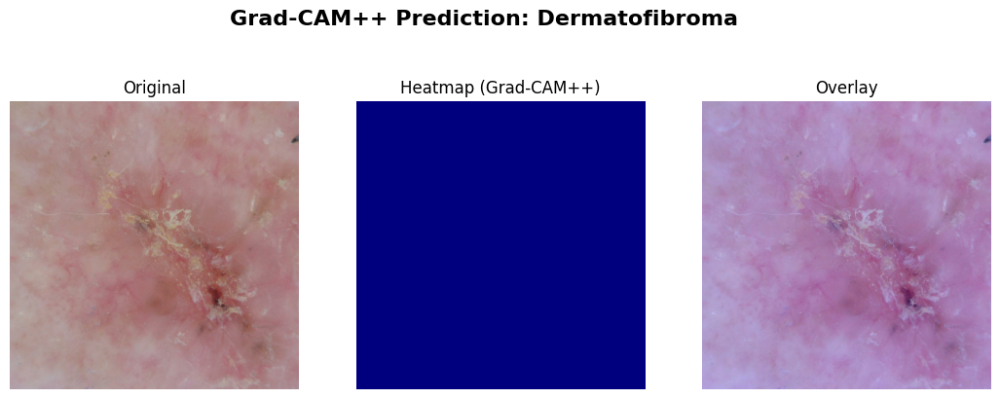

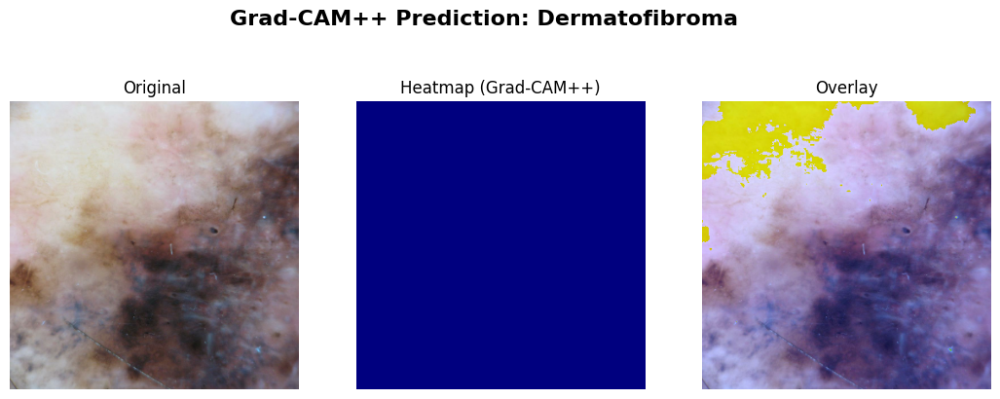

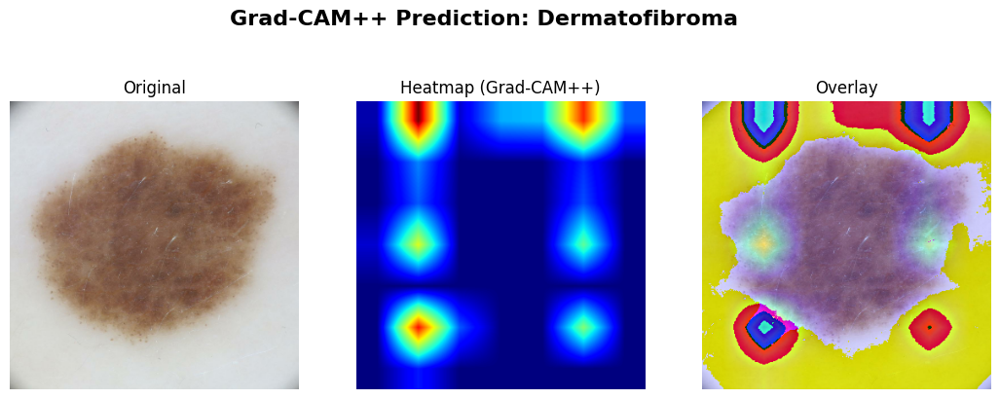

In [ ]:
IMAGE_PATHS = [
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0070081.jpg',
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0066863.jpg',
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0059439.jpg'
]

for p in IMAGE_PATHS:
    show_gradcam_plus(p, model, last_conv="block6d_project_conv", class_map=idx2class)

# Final EfficientNetB0 Clean Rebuild + Grad-CAM++ Code

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

IMG_SIZE = (224, 224)
NUM_CLASSES = 10

#CLEAN MODEL REBUILD
def build_clean_efficientnet():
    inputs = keras.Input(shape=(224,224,3))

    # SAME preprocessing as training
    x = layers.Rescaling(1./255)(inputs)

    # Data augmentation (same order as training)
    x = layers.RandomFlip("horizontal")(x)
    x = layers.RandomRotation(0.05)(x)
    x = layers.RandomZoom(0.1)(x)

    # Load EfficientNetB0 backbone
    base = keras.applications.EfficientNetB0(
        include_top=False,
        weights="imagenet",
        pooling=None
    )
    base.trainable = True  # important

    x = base(x)

    # Same top layers as before
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = keras.Model(inputs, outputs)
    return model


# Build fresh model with correct graph
clean_model = build_clean_efficientnet()

# Load weights from your final checkpoint
ckpt_path = "/content/drive/MyDrive/CSCI7335/Project/effb0_phase2_final.keras"
clean_model.load_weights(ckpt_path)

print("Clean model rebuilt and weights loaded correctly!")


ValueError: A total of 131 objects could not be loaded. Example error message for object <Normalization name=normalization_4, built=True>:

Layer 'normalization_4' expected 3 variables, but received 0 variables during loading. Expected: ['mean', 'variance', 'count']

List of objects that could not be loaded:
[<Normalization name=normalization_4, built=True>, <Conv2D name=stem_conv, built=True>, <BatchNormalization name=stem_bn, built=True>, <DepthwiseConv2D name=block1a_dwconv, built=True>, <BatchNormalization name=block1a_bn, built=True>, <Conv2D name=block1a_se_reduce, built=True>, <Conv2D name=block1a_se_expand, built=True>, <Conv2D name=block1a_project_conv, built=True>, <BatchNormalization name=block1a_project_bn, built=True>, <Conv2D name=block2a_expand_conv, built=True>, <BatchNormalization name=block2a_expand_bn, built=True>, <DepthwiseConv2D name=block2a_dwconv, built=True>, <BatchNormalization name=block2a_bn, built=True>, <Conv2D name=block2a_se_reduce, built=True>, <Conv2D name=block2a_se_expand, built=True>, <Conv2D name=block2a_project_conv, built=True>, <BatchNormalization name=block2a_project_bn, built=True>, <Conv2D name=block2b_expand_conv, built=True>, <BatchNormalization name=block2b_expand_bn, built=True>, <DepthwiseConv2D name=block2b_dwconv, built=True>, <BatchNormalization name=block2b_bn, built=True>, <Conv2D name=block2b_se_reduce, built=True>, <Conv2D name=block2b_se_expand, built=True>, <Conv2D name=block2b_project_conv, built=True>, <BatchNormalization name=block2b_project_bn, built=True>, <Conv2D name=block3a_expand_conv, built=True>, <BatchNormalization name=block3a_expand_bn, built=True>, <DepthwiseConv2D name=block3a_dwconv, built=True>, <BatchNormalization name=block3a_bn, built=True>, <Conv2D name=block3a_se_reduce, built=True>, <Conv2D name=block3a_se_expand, built=True>, <Conv2D name=block3a_project_conv, built=True>, <BatchNormalization name=block3a_project_bn, built=True>, <Conv2D name=block3b_expand_conv, built=True>, <BatchNormalization name=block3b_expand_bn, built=True>, <DepthwiseConv2D name=block3b_dwconv, built=True>, <BatchNormalization name=block3b_bn, built=True>, <Conv2D name=block3b_se_reduce, built=True>, <Conv2D name=block3b_se_expand, built=True>, <Conv2D name=block3b_project_conv, built=True>, <BatchNormalization name=block3b_project_bn, built=True>, <Conv2D name=block4a_expand_conv, built=True>, <BatchNormalization name=block4a_expand_bn, built=True>, <DepthwiseConv2D name=block4a_dwconv, built=True>, <BatchNormalization name=block4a_bn, built=True>, <Conv2D name=block4a_se_reduce, built=True>, <Conv2D name=block4a_se_expand, built=True>, <Conv2D name=block4a_project_conv, built=True>, <BatchNormalization name=block4a_project_bn, built=True>, <Conv2D name=block4b_expand_conv, built=True>, <BatchNormalization name=block4b_expand_bn, built=True>, <DepthwiseConv2D name=block4b_dwconv, built=True>, <BatchNormalization name=block4b_bn, built=True>, <Conv2D name=block4b_se_reduce, built=True>, <Conv2D name=block4b_se_expand, built=True>, <Conv2D name=block4b_project_conv, built=True>, <BatchNormalization name=block4b_project_bn, built=True>, <Conv2D name=block4c_expand_conv, built=True>, <BatchNormalization name=block4c_expand_bn, built=True>, <DepthwiseConv2D name=block4c_dwconv, built=True>, <BatchNormalization name=block4c_bn, built=True>, <Conv2D name=block4c_se_reduce, built=True>, <Conv2D name=block4c_se_expand, built=True>, <Conv2D name=block4c_project_conv, built=True>, <BatchNormalization name=block4c_project_bn, built=True>, <Conv2D name=block5a_expand_conv, built=True>, <BatchNormalization name=block5a_expand_bn, built=True>, <DepthwiseConv2D name=block5a_dwconv, built=True>, <BatchNormalization name=block5a_bn, built=True>, <Conv2D name=block5a_se_reduce, built=True>, <Conv2D name=block5a_se_expand, built=True>, <Conv2D name=block5a_project_conv, built=True>, <BatchNormalization name=block5a_project_bn, built=True>, <Conv2D name=block5b_expand_conv, built=True>, <BatchNormalization name=block5b_expand_bn, built=True>, <DepthwiseConv2D name=block5b_dwconv, built=True>, <BatchNormalization name=block5b_bn, built=True>, <Conv2D name=block5b_se_reduce, built=True>, <Conv2D name=block5b_se_expand, built=True>, <Conv2D name=block5b_project_conv, built=True>, <BatchNormalization name=block5b_project_bn, built=True>, <Conv2D name=block5c_expand_conv, built=True>, <BatchNormalization name=block5c_expand_bn, built=True>, <DepthwiseConv2D name=block5c_dwconv, built=True>, <BatchNormalization name=block5c_bn, built=True>, <Conv2D name=block5c_se_reduce, built=True>, <Conv2D name=block5c_se_expand, built=True>, <Conv2D name=block5c_project_conv, built=True>, <BatchNormalization name=block5c_project_bn, built=True>, <Conv2D name=block6a_expand_conv, built=True>, <BatchNormalization name=block6a_expand_bn, built=True>, <DepthwiseConv2D name=block6a_dwconv, built=True>, <BatchNormalization name=block6a_bn, built=True>, <Conv2D name=block6a_se_reduce, built=True>, <Conv2D name=block6a_se_expand, built=True>, <Conv2D name=block6a_project_conv, built=True>, <BatchNormalization name=block6a_project_bn, built=True>, <Conv2D name=block6b_expand_conv, built=True>, <BatchNormalization name=block6b_expand_bn, built=True>, <DepthwiseConv2D name=block6b_dwconv, built=True>, <BatchNormalization name=block6b_bn, built=True>, <Conv2D name=block6b_se_reduce, built=True>, <Conv2D name=block6b_se_expand, built=True>, <Conv2D name=block6b_project_conv, built=True>, <BatchNormalization name=block6b_project_bn, built=True>, <Conv2D name=block6c_expand_conv, built=True>, <BatchNormalization name=block6c_expand_bn, built=True>, <DepthwiseConv2D name=block6c_dwconv, built=True>, <BatchNormalization name=block6c_bn, built=True>, <Conv2D name=block6c_se_reduce, built=True>, <Conv2D name=block6c_se_expand, built=True>, <Conv2D name=block6c_project_conv, built=True>, <BatchNormalization name=block6c_project_bn, built=True>, <Conv2D name=block6d_expand_conv, built=True>, <BatchNormalization name=block6d_expand_bn, built=True>, <DepthwiseConv2D name=block6d_dwconv, built=True>, <BatchNormalization name=block6d_bn, built=True>, <Conv2D name=block6d_se_reduce, built=True>, <Conv2D name=block6d_se_expand, built=True>, <Conv2D name=block6d_project_conv, built=True>, <BatchNormalization name=block6d_project_bn, built=True>, <Conv2D name=block7a_expand_conv, built=True>, <BatchNormalization name=block7a_expand_bn, built=True>, <DepthwiseConv2D name=block7a_dwconv, built=True>, <BatchNormalization name=block7a_bn, built=True>, <Conv2D name=block7a_se_reduce, built=True>, <Conv2D name=block7a_se_expand, built=True>, <Conv2D name=block7a_project_conv, built=True>, <BatchNormalization name=block7a_project_bn, built=True>, <Conv2D name=top_conv, built=True>, <BatchNormalization name=top_bn, built=True>]

In [ ]:
from tensorflow import keras
final_model = keras.models.load_model("/content/drive/MyDrive/CSCI7335/Project/effb0_phase2_final.keras")
final_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 224, 224,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 10,574,963 (40.34 MB)

 Trainable params: 3,256,290 (12.42 MB)

 Non-trainable params: 806,091 (3.07 MB)

 Optimizer params: 6,512,582 (24.84 MB)

In [ ]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt


def grad_cam_plus_plus(model, img_tensor, last_conv_layer_name):
    conv_layer = model.get_layer(last_conv_layer_name)

    grad_model = tf.keras.models.Model(
        [model.inputs],
        [conv_layer.output, model.output]
    )

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_out, preds = grad_model(img_tensor)
                class_idx = tf.argmax(preds[0])
                class_output = preds[:, class_idx]

            grads1 = tape3.gradient(class_output, conv_out)
        grads2 = tape2.gradient(grads1, conv_out)

    grads3 = tape1.gradient(grads2, conv_out)

    conv_out = conv_out[0]
    grads1 = grads1[0]
    grads2 = grads2[0]
    grads3 = grads3[0]

    numerator = grads2
    denominator = grads2 * 2.0 + grads3 * conv_out
    denominator = tf.where(denominator != 0, denominator, tf.ones_like(denominator))

    alphas = numerator / denominator
    positive = tf.nn.relu(grads1)

    weights = tf.reduce_sum(alphas * positive, axis=(0,1))

    cam = tf.reduce_sum(weights * conv_out, axis=-1)
    cam = tf.nn.relu(cam)
    cam = cam - tf.reduce_min(cam)
    cam = cam / (tf.reduce_max(cam) + 1e-12)

    return cam.numpy(), int(class_idx)

In [ ]:
def load_for_model(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)

    img_resized = tf.image.resize(img, (224,224))
    img_tensor = tf.expand_dims(img_resized, 0)  # batch dimension

    orig = tf.image.resize(img, (350,350)) / 255.0

    return img_tensor, orig

In [ ]:
def show_gradcam_pp(model, img_path, last_conv="block5c_project_conv"):

    img_tensor, orig = load_for_model(img_path)
    heatmap, pred_idx = grad_cam_plus_plus(model, img_tensor, last_conv)

    pred_class = idx2class[pred_idx]

    heatmap = cv2.resize(heatmap, (orig.shape[1], orig.shape[0]))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = (heatmap_color * 0.45 + orig.numpy() * 255).astype(np.uint8)

    plt.figure(figsize=(12,5))
    plt.suptitle(f"Grad-CAM++ Prediction: {pred_class}", fontsize=16, fontweight="bold")

    plt.subplot(1,3,1); plt.imshow(orig); plt.title("Original"); plt.axis("off")
    plt.subplot(1,3,2); plt.imshow(heatmap, cmap='jet'); plt.title("Heatmap"); plt.axis("off")
    plt.subplot(1,3,3); plt.imshow(overlay); plt.title("Overlay"); plt.axis("off")
    plt.show()

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=['Tensor(shape=(1, 224, 224, 3))']
  warnings.warn(msg)


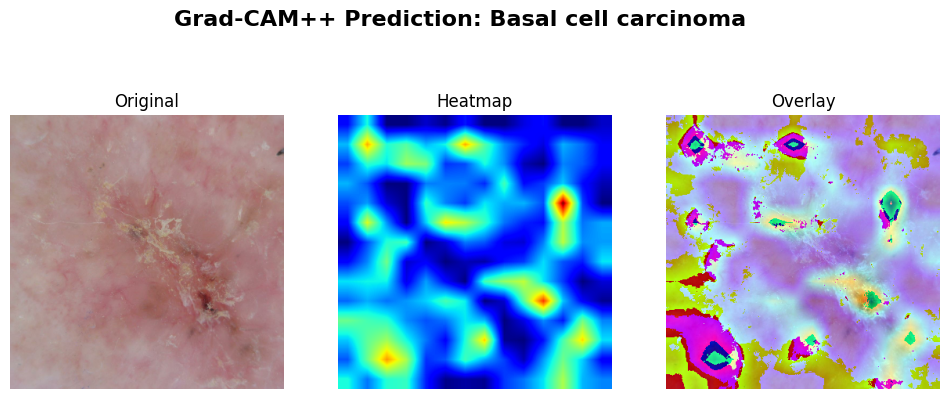

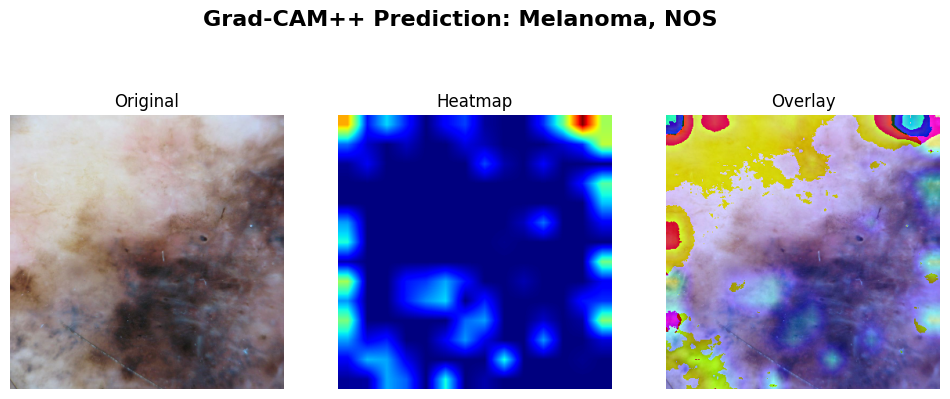

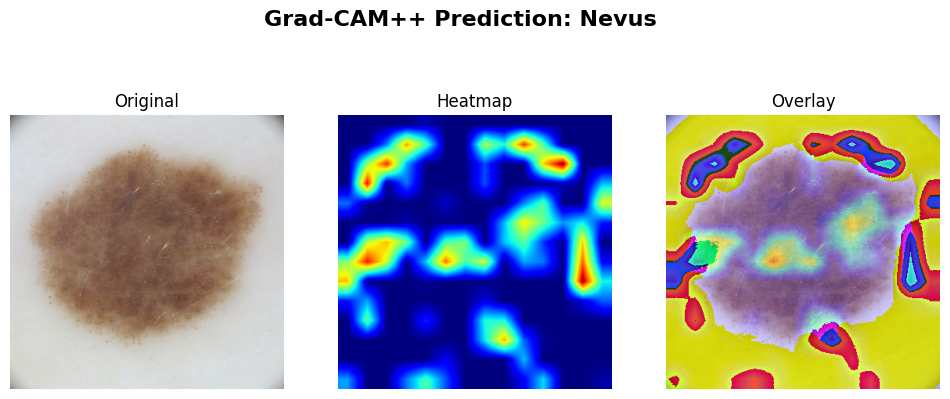

In [ ]:
IMAGE_PATHS = [
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0070081.jpg',
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0066863.jpg',
    '/content/drive/MyDrive/CSCI7335/Project/ISIC-images/ISIC_0059439.jpg'
]

for p in IMAGE_PATHS:
    show_gradcam_pp(final_model, p)

# Error Analysis with Confusion Matrix and Grad-CAM++

83/83 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step


<Figure size 1000x1000 with 0 Axes>

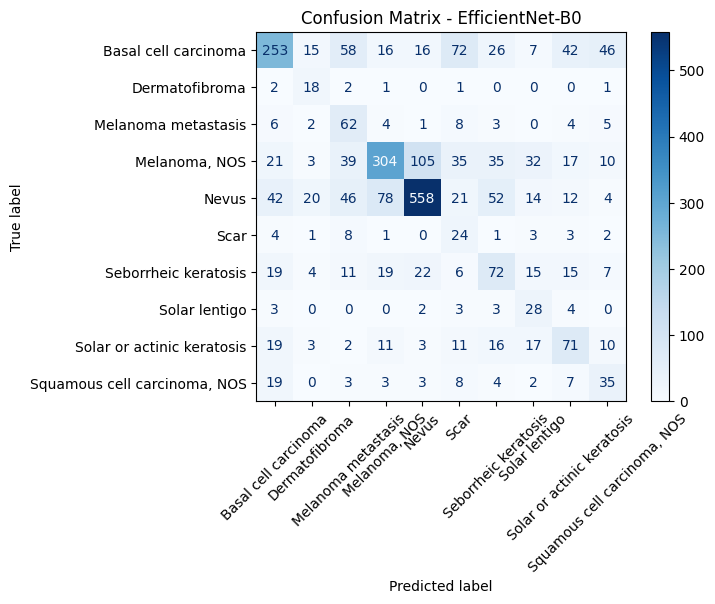

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)

plt.figure(figsize=(10, 10))
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix - EfficientNet-B0")
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

def make_gradcampp_heatmap(model, img_array, class_index, last_conv_layer_name="top_conv"):
    """
    Calculating Grad-CAM++ by EfficientNet-B0
    """
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape(persistent=True) as tape1:
        with tf.GradientTape(persistent=True) as tape2:
            with tf.GradientTape() as tape3:
                conv_outputs, predictions = grad_model(tf.expand_dims(img_array, axis=0))
                class_score = predictions[:, class_index]

            grads = tape3.gradient(class_score, conv_outputs)

        first_derivative = tape2.gradient(class_score, conv_outputs)
    second_derivative = tape1.gradient(class_score, conv_outputs)

    # Grad-CAM++ weights
    global_sum = np.sum(conv_outputs.numpy()[0], axis=(0, 1))
    eps = 1e-8

    alpha_num = second_derivative[0]
    alpha_den = 2 * second_derivative[0] + first_derivative[0] * global_sum[..., np.newaxis]
    alpha_den = np.where(alpha_den != 0, alpha_den, eps)

    alphas = alpha_num / alpha_den

    weights = np.maximum(first_derivative[0], 0)
    deep_linearization = np.sum(alphas * weights, axis=(0, 1))

    heatmap = np.sum(deep_linearization * conv_outputs.numpy()[0], axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap / (np.max(heatmap) + eps)

    return heatmap


def make_gradcampp_plot(model, img, class_name, overlay_alpha=0.45):

    # EfficientNet normalize
    img_resized = tf.image.resize(img, (224, 224))
    img_proc = img_resized.numpy()

    # Prediction
    preds = model.predict(tf.expand_dims(img_proc, axis=0))
    class_index = np.argmax(preds[0])

    # Calculate Heatmap
    heatmap = make_gradcampp_heatmap(model, img_proc, class_index)

    # Expand image to original size
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_resized = np.uint8(255 * heatmap_resized)

    # Apply colormap
    cmap = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cmap, overlay_alpha, (img.numpy()*255).astype("uint8"), 1-overlay_alpha, 0)

    # Plot
    plt.figure(figsize=(14, 6))

    plt.suptitle(f"Grad-CAM++  Prediction: {class_name}", fontsize=18)

    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Heatmap")
    plt.imshow(heatmap, cmap="jet")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay[..., ::-1])
    plt.axis("off")

    plt.show()

Total misclassified samples: 1221
Generating Grad-CAM++ for 30 samples...


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_241']]
Received: inputs=['Tensor(shape=(1, 224, 224, 3))']
  warnings.warn(msg)


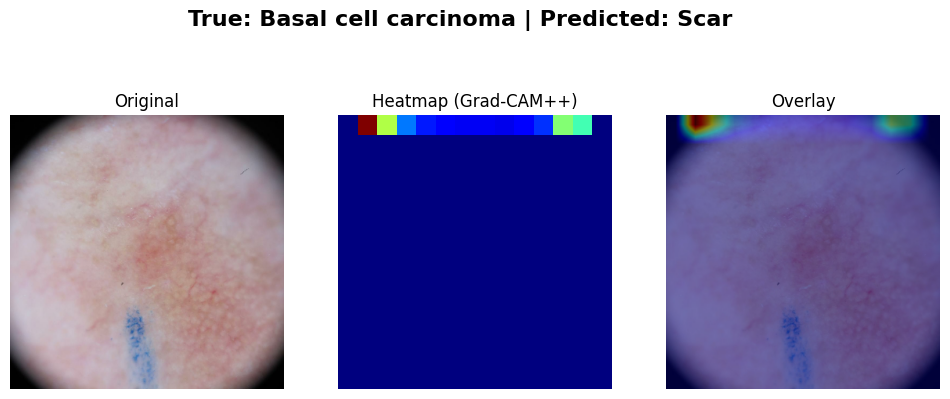

----------------------------------------


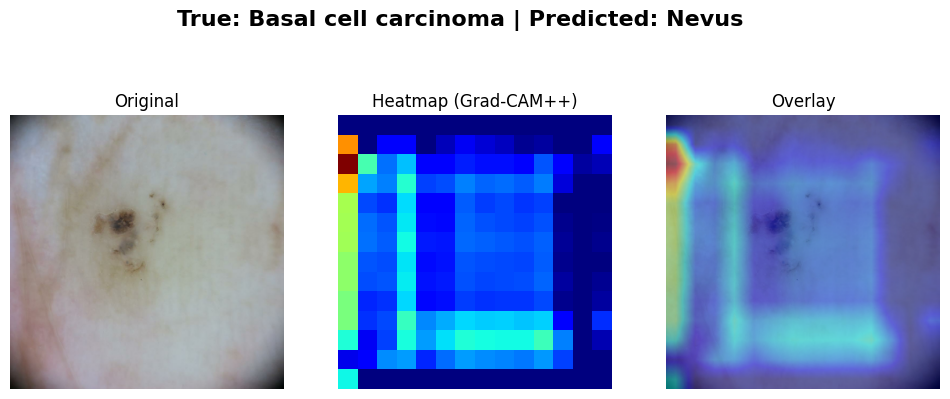

----------------------------------------


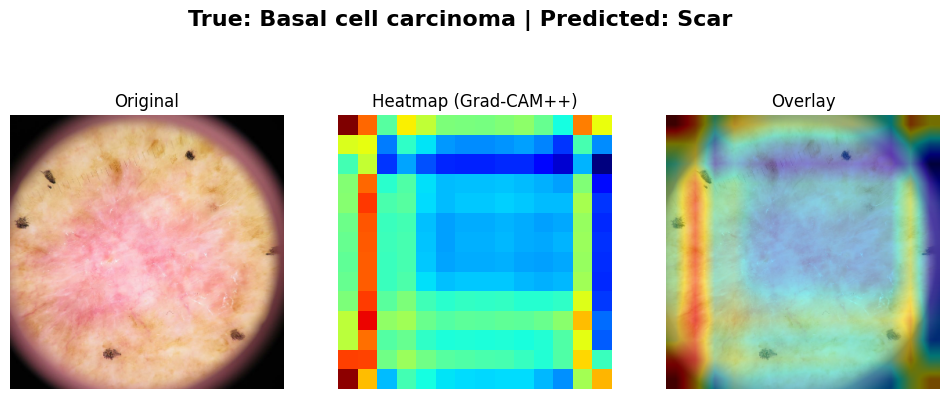

----------------------------------------


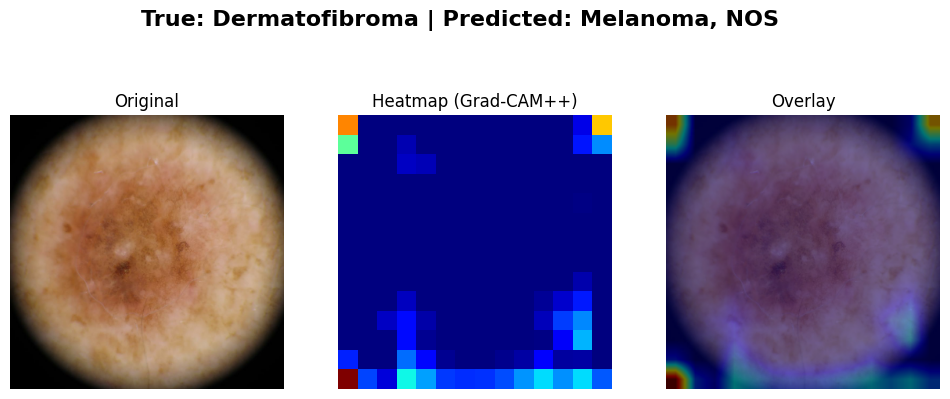

----------------------------------------


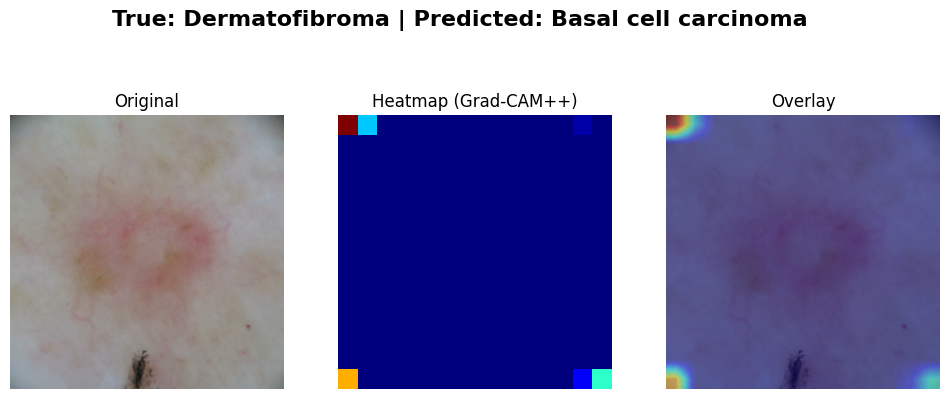

----------------------------------------


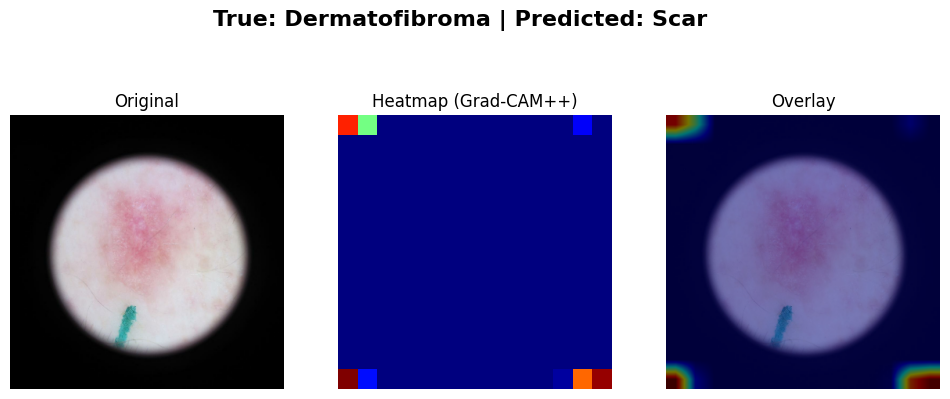

----------------------------------------


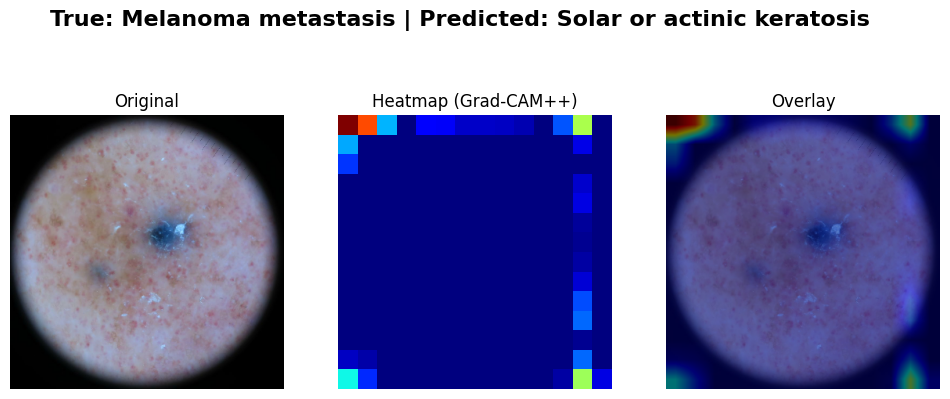

----------------------------------------


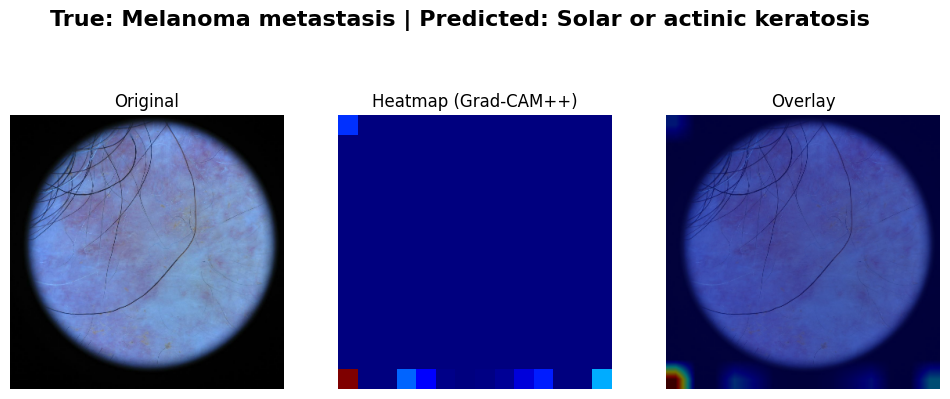

----------------------------------------


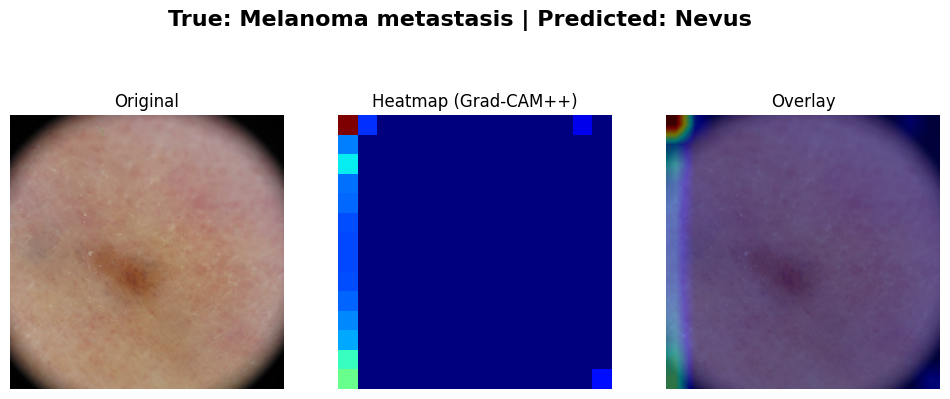

----------------------------------------


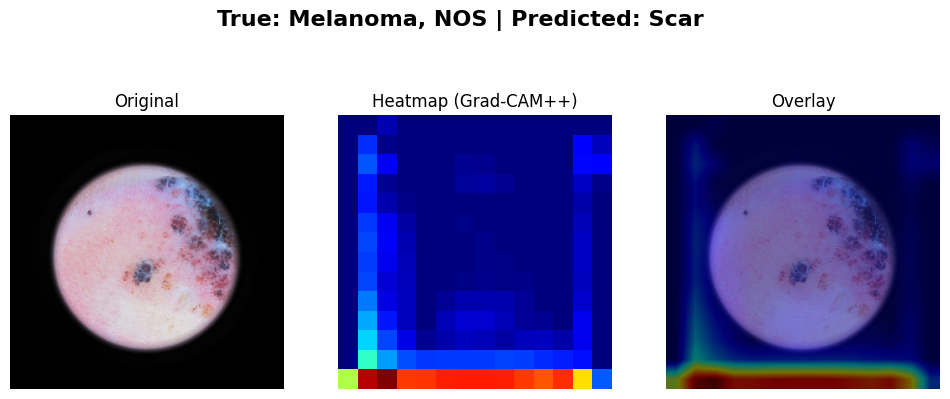

----------------------------------------


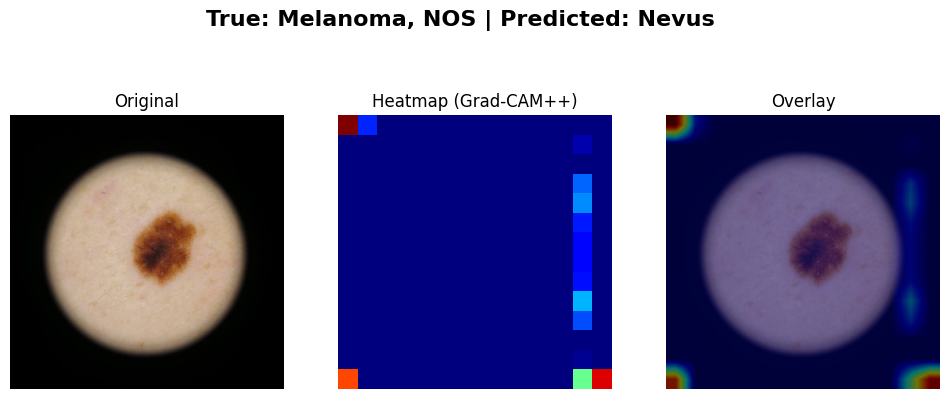

----------------------------------------


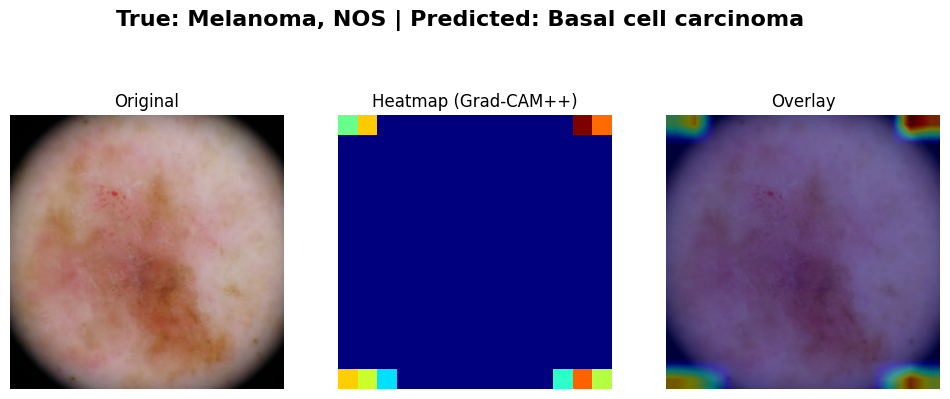

----------------------------------------


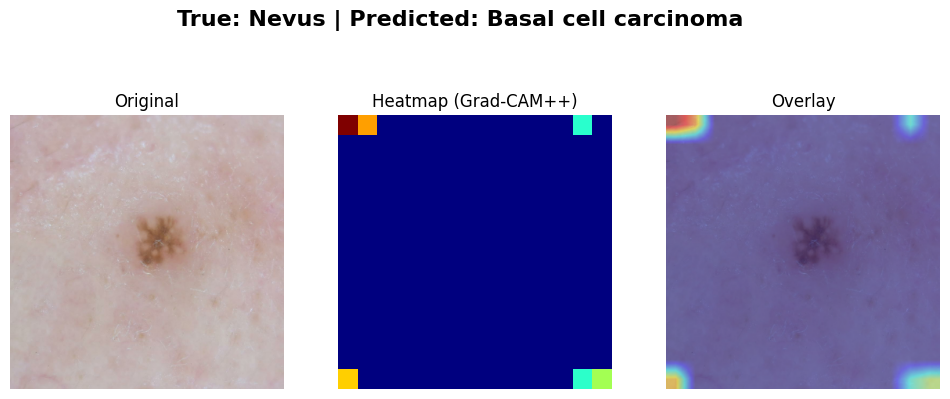

----------------------------------------


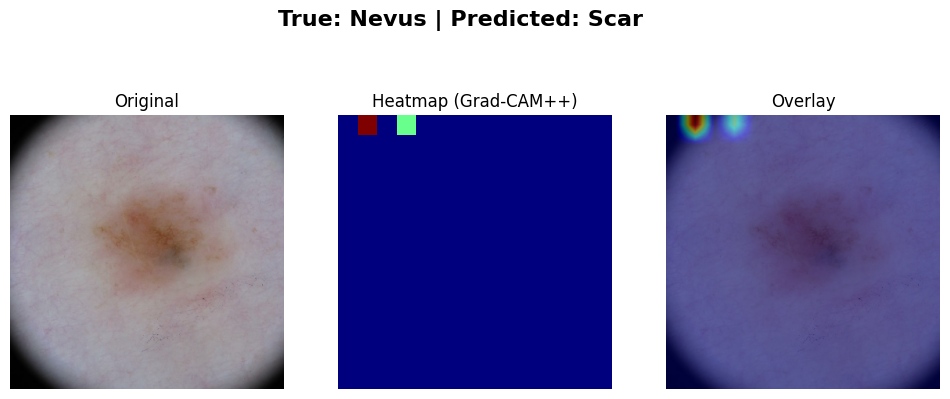

----------------------------------------


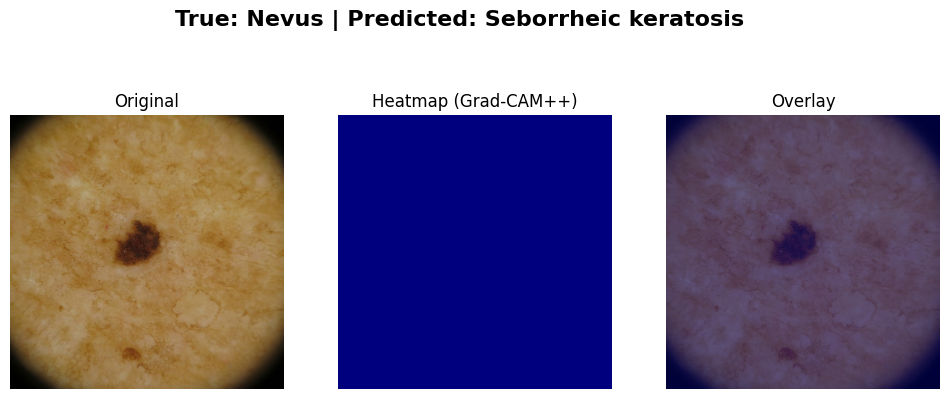

----------------------------------------


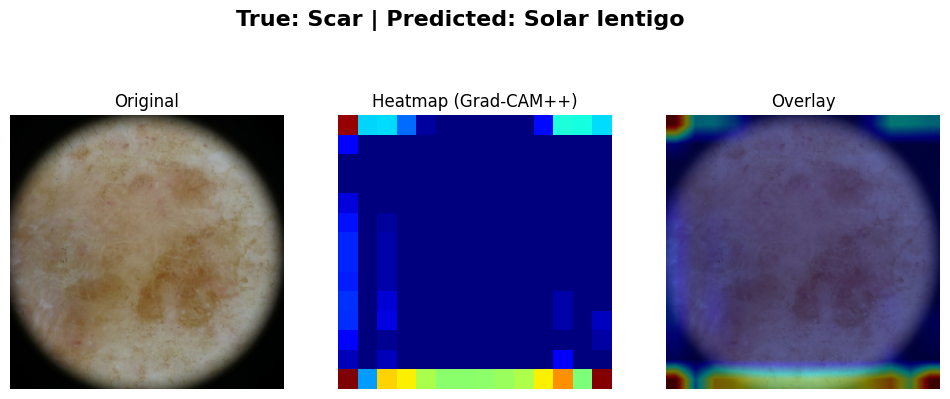

----------------------------------------


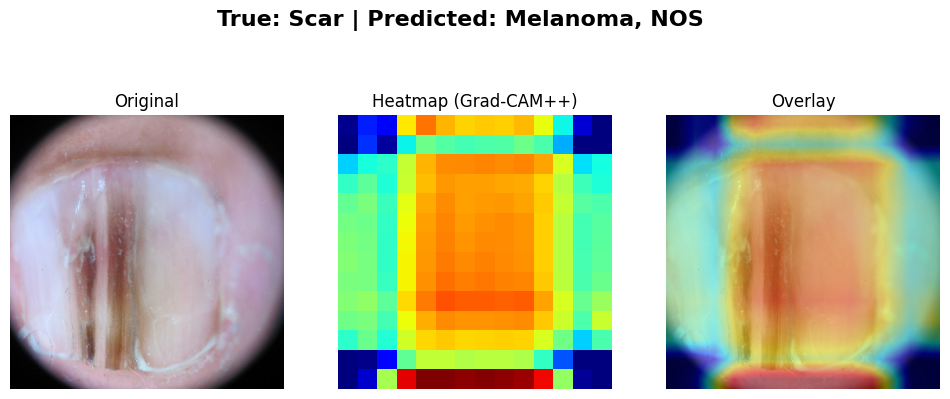

----------------------------------------


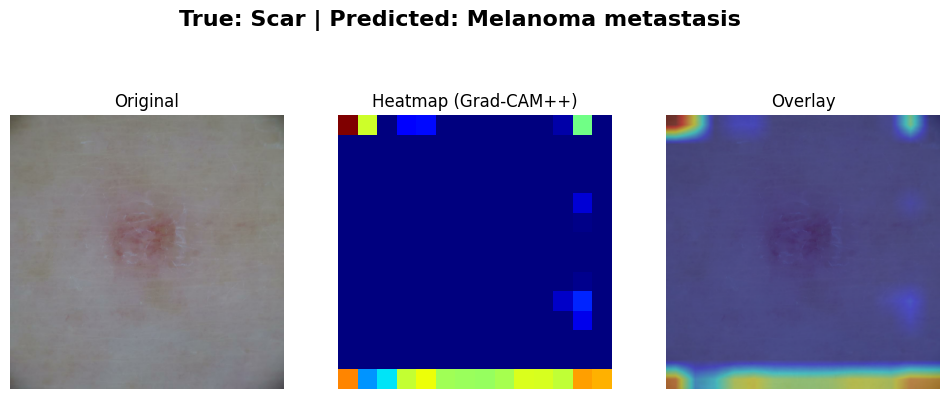

----------------------------------------


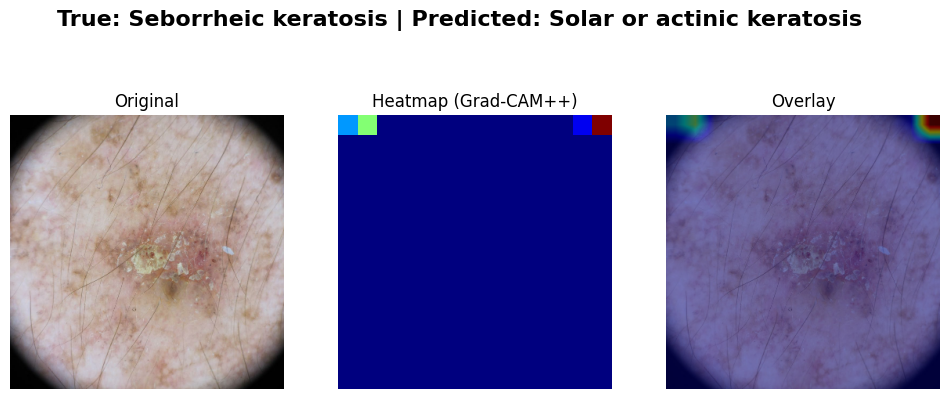

----------------------------------------


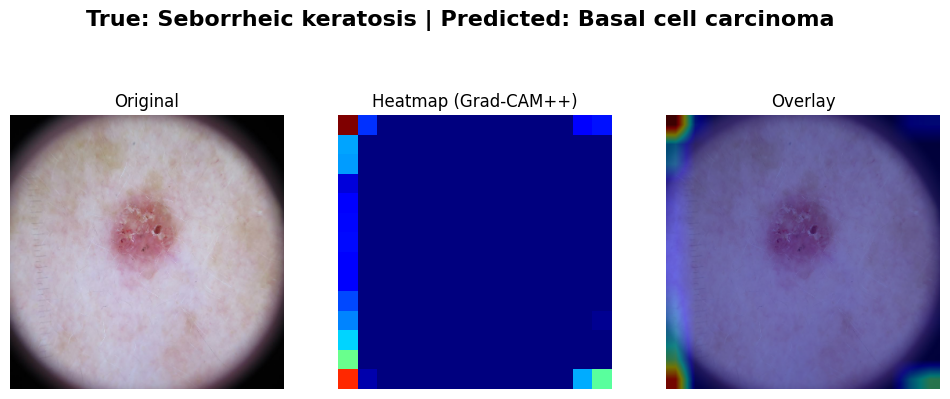

----------------------------------------


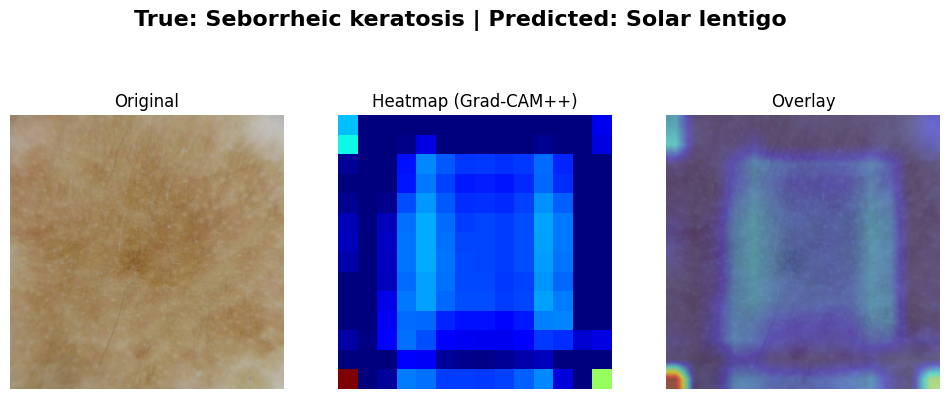

----------------------------------------


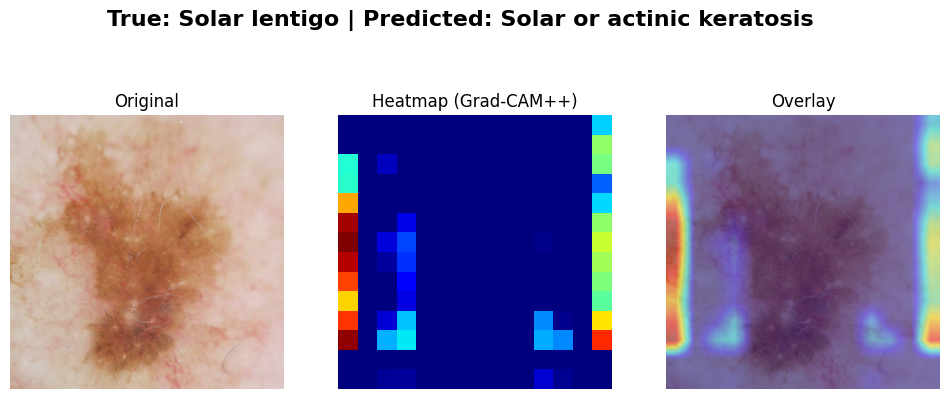

----------------------------------------


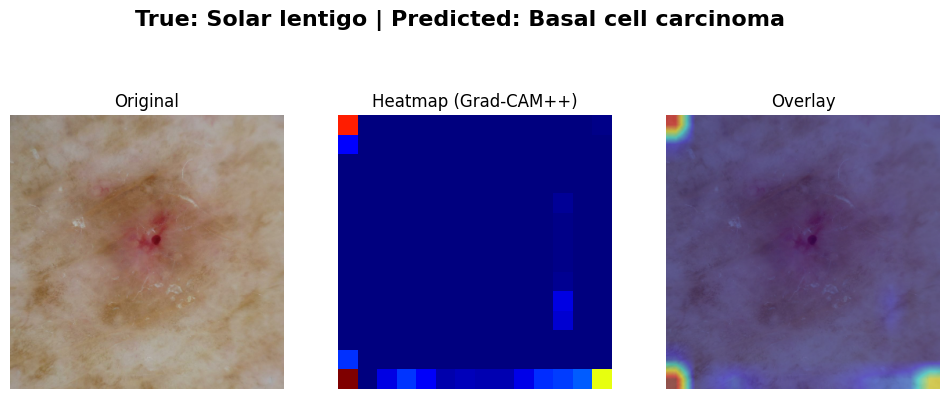

----------------------------------------


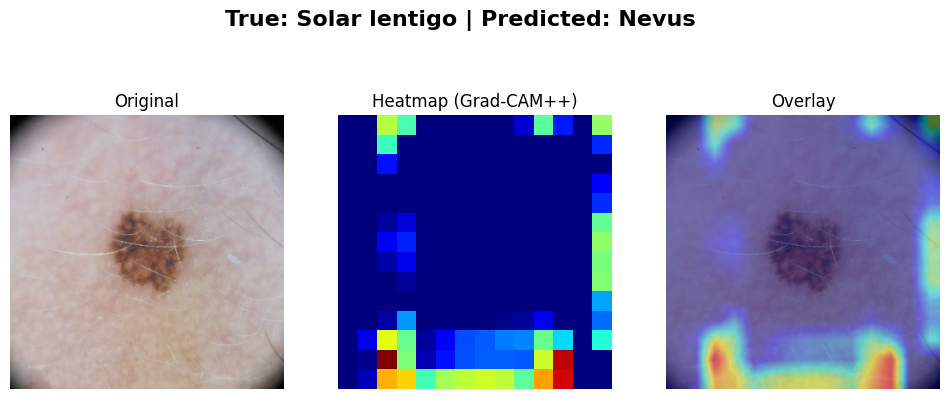

----------------------------------------


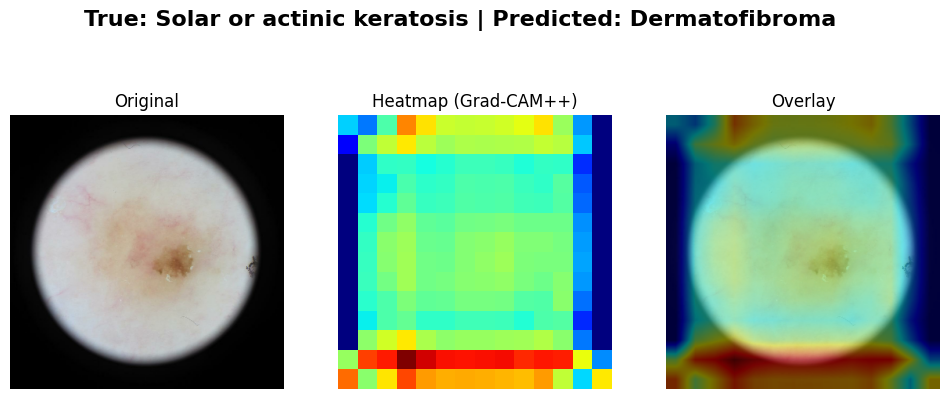

----------------------------------------


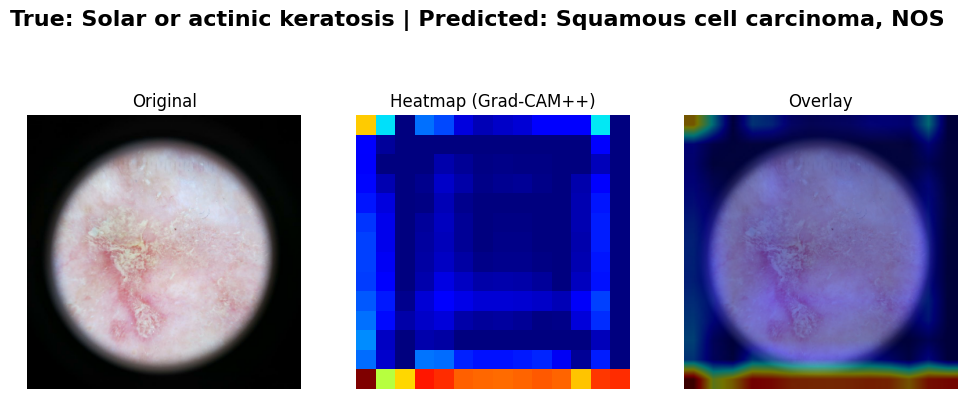

----------------------------------------


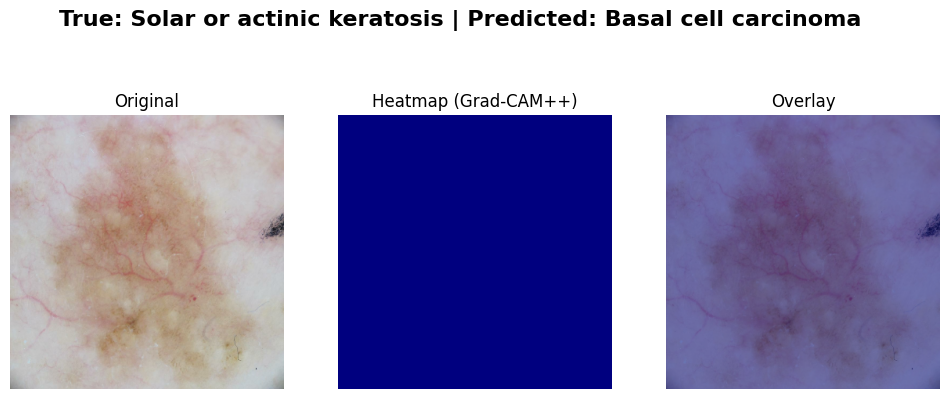

----------------------------------------


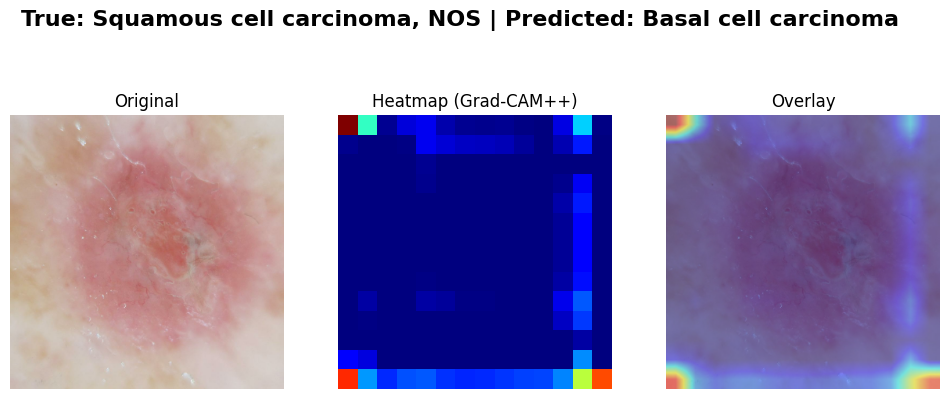

----------------------------------------


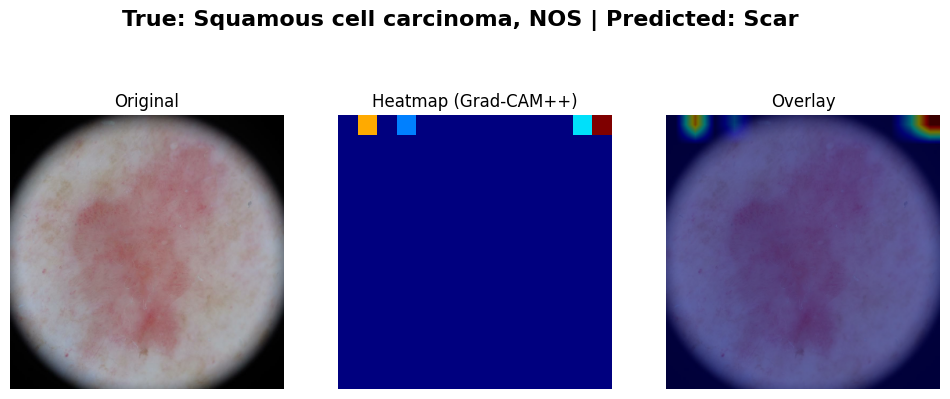

----------------------------------------


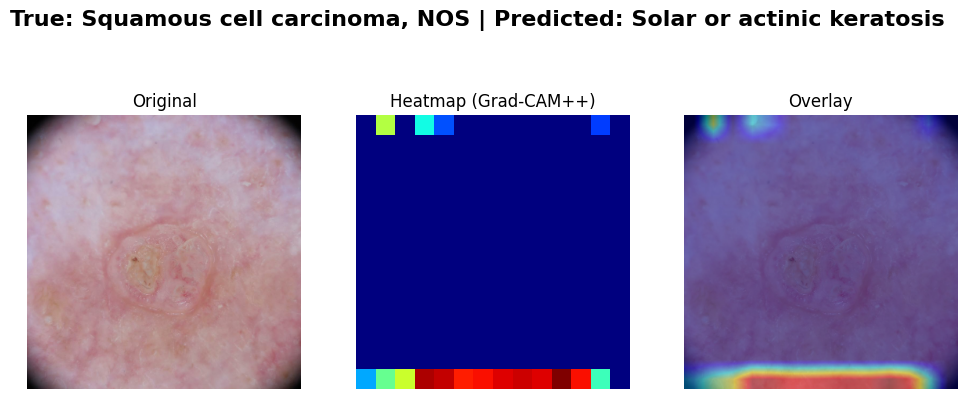

----------------------------------------


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import os

# Helper function to load and preprocess an image for the model
# and get the original image for display.
def load_image_for_gradcampp_display(img_path, img_size=(224, 224)):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)

    # For display: original image, resized but not normalized yet
    orig_display = tf.image.resize(img, (350, 350))
    orig_display_np = orig_display.numpy().astype('uint8')

    # For model prediction: resized and preprocessed (normalized 0-1)
    img_tensor = tf.image.resize(img, img_size) / 255.0
    img_tensor = tf.expand_dims(img_tensor, 0) # Add batch dimension

    return img_tensor, orig_display_np

# Helper function for Grad-CAM++ calculation (copied from BK5uWugmSVGa to ensure it's available in this scope)
def grad_cam_plus_plus(model, img_tensor, last_conv_layer_name):
    conv_layer = model.get_layer(last_conv_layer_name)

    grad_model = tf.keras.models.Model(
        [model.inputs],
        [conv_layer.output, model.output]
    )

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_out, preds = grad_model(img_tensor)
                class_idx = tf.argmax(preds[0])
                class_output = preds[:, class_idx]

            grads1 = tape3.gradient(class_output, conv_out)
        grads2 = tape2.gradient(grads1, conv_out)

    grads3 = tape1.gradient(grads2, conv_out)

    conv_out = conv_out[0]
    grads1 = grads1[0]
    grads2 = grads2[0]
    grads3 = grads3[0]

    numerator = grads2
    denominator = grads2 * 2.0 + grads3 * conv_out
    denominator = tf.where(denominator != 0, denominator, tf.ones_like(denominator))

    alphas = numerator / denominator
    positive = tf.nn.relu(grads1)

    weights = tf.reduce_sum(alphas * positive, axis=(0,1))

    cam = tf.reduce_sum(weights * conv_out, axis=-1)
    cam = tf.nn.relu(cam)
    cam = cam - tf.reduce_min(cam)
    cam = cam / (tf.reduce_max(cam) + 1e-12)

    return cam.numpy(), int(class_idx)

# The plotting function for misclassified samples
def plot_misclassified_gradcampp(model, img_path, true_label_idx, pred_label_idx, class_map, last_conv="block5c_project_conv", overlay_alpha=0.45):
    img_tensor, orig_display_np = load_image_for_gradcampp_display(img_path)

    # Ensure to use the grad_cam_plus_plus defined within this cell or the globally correct one
    heatmap, _ = grad_cam_plus_plus(model, img_tensor, last_conv)

    true_class_name = class_map[true_label_idx]
    predicted_class_name = class_map[pred_label_idx]

    heatmap_resized = cv2.resize(heatmap, (orig_display_np.shape[1], orig_display_np.shape[0]))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_color_rgb = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB) # Convert BGR to RGB for matplotlib

    overlay = cv2.addWeighted(orig_display_np, 1 - overlay_alpha, heatmap_color_rgb, overlay_alpha, 0)

    plt.figure(figsize=(12, 5))
    plt.suptitle(
        f"True: {true_class_name} | Predicted: {predicted_class_name}",
        fontsize=16,
        fontweight='bold'
    )

    plt.subplot(1, 3, 1)
    plt.title("Original")
    plt.imshow(orig_display_np)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Heatmap (Grad-CAM++)")
    plt.imshow(heatmap, cmap="jet")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()

# --- Original logic from the cell, modified to use the new plotting function ---

wrong_idx = np.where(y_true != y_pred)[0]

print(f"Total misclassified samples: {len(wrong_idx)}")

samples_per_class = 3
selected_indices_in_test_df = []

for c in range(len(classes)):
    # Find indices in `wrong_idx` where the true label matches class 'c'
    cls_wrong_local_indices = np.where(y_true[wrong_idx] == c)[0]
    # Get the actual indices from `test_df` corresponding to these wrong predictions
    cls_wrong_test_df_indices = wrong_idx[cls_wrong_local_indices]
    selected_indices_in_test_df.extend(cls_wrong_test_df_indices[:samples_per_class])

print(f"Generating Grad-CAM++ for {len(selected_indices_in_test_df)} samples...")

for i in selected_indices_in_test_df:
    img_path = test_df.iloc[i]["filepath"] # Get filepath from test_df
    true_label_idx = y_true[i]
    pred_label_idx = y_pred[i]

    # Call the new plotting function
    plot_misclassified_gradcampp(
        model, # Use the model from the notebook state (Phase 2/3 trained model)
        img_path,
        true_label_idx,
        pred_label_idx,
        idx2class # Pass the global idx2class map
    )
    print("----------------------------------------")
